In [1]:
import pickle
import random

import pygsti
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib import cm, colors

from mpl_toolkits.mplot3d import Axes3D

from reset import QuantumSim, prep_projector_matrices_pp
from qiskit.visualization import plot_bloch_multivector, plot_bloch_vector
from math_objects import *

In [2]:
path = "./noise_dict.pkl"
with open(path, "rb") as f:
    error_dict = pickle.load(f)

avaliable_couplings = []
H_single_list = []
H_double_list = []
S_single_list = []
S_double_list = []
A_single_list = []
A_double_list = []

for gate, error_params in error_dict.items():
    avaliable_couplings.append((gate[1], gate[2]))
    H_single = []
    H_double = []
    S_single = []
    S_double = []
    A_single = []
    A_double = []
    for error_name, error_rate in error_params.items():
        error_type = error_name.split(':')[0]
        if len(error_type) == 2:
            if error_type[0] == 'H':
                H_single.append(error_rate)
            elif error_type[0] == 'S':
                S_single.append(error_rate)
            else:
                A_single.append(error_rate)
        
        else:
            if error_type[0] == 'H':
                H_double.append(error_rate)
            elif error_type[0] == 'S':
                S_double.append(error_rate)
            else:
                A_double.append(error_rate)

        if len(H_single) == 3:
            H_single_list.append(norm(H_single))
            H_single = []
        
        if len(S_single) == 3:
            S_single_list.append(norm(S_single))
            S_single = []
            
        if len(A_single) == 3:
            A_single_list.append(norm(A_single))
            A_single = []
            
        if len(H_double) == 9:
            H_double_list.append(norm(H_double))
            H_double = []
        
        if len(S_double) == 9:
            S_double_list.append(norm(S_double))
            S_double = []
            
        if len(A_double) == 9:
            A_double_list.append(norm(A_double))
            A_double = []
        
        
print(np.median(H_double_list))

0.013447891256743352


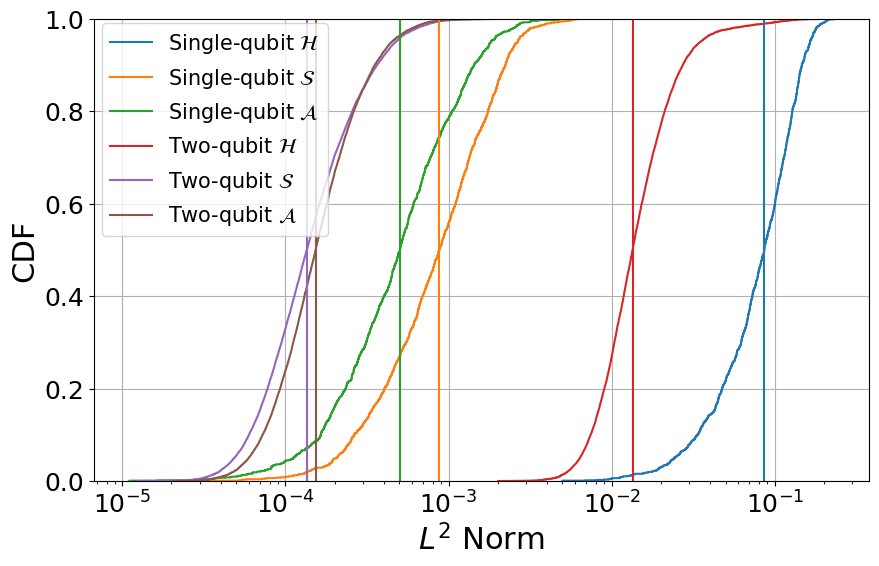

In [43]:
#H_single_list_sorted = sorted(H_single_list)
#S_single_list_sorted = sorted(S_single_list)
#A_single_list_sorted = sorted(A_single_list)
#H_double_list_sorted = sorted(H_double_list)
#S_double_list_sorted = sorted(S_double_list)
#A_double_list_sorted = sorted(A_double_list)

labels = [r'Single-qubit $\mathcal{H}$', r'Single-qubit $\mathcal{S}$', r'Single-qubit $\mathcal{A}$',
          r'Two-qubit $\mathcal{H}$', r'Two-qubit $\mathcal{S}$', r'Two-qubit $\mathcal{A}$']

fig, ax = plt.subplots(figsize=(10, 6))

ax.ecdf(H_single_list, label=labels[0])
ax.ecdf(S_single_list, label=labels[1])
ax.ecdf(A_single_list, label=labels[2])
ax.ecdf(H_double_list, label=labels[3])
ax.ecdf(S_double_list, label=labels[4])
ax.ecdf(A_double_list, label=labels[5])

ax.vlines(np.median(H_single_list), 0, 1)
ax.vlines(np.median(S_single_list), 0, 1, color='C1')
ax.vlines(np.median(A_single_list), 0, 1, colors='C2')
ax.vlines(np.median(H_double_list), 0, 1, colors='C3')
ax.vlines(np.median(S_double_list), 0, 1, colors='C4')
ax.vlines(np.median(A_double_list), 0, 1, colors='C5')

#n, bins, patches = ax.hist(H_single_list_sorted, 50, density=True, histtype="step",
#                               cumulative=True, label="Cumulative histogram")

ax.set_xscale('log')
ax.legend(fontsize=15, loc=(0.01,0.53))
ax.grid()
#ax.set_title('Cummulative ratio', fontsize=22)
ax.set_ylabel('CDF',fontsize=22)
ax.set_xlabel(r"$L^2$ Norm",fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=18)
fig.savefig('C:/Users/k0426/Documents/PhD_Project/paper 1/HSA error parameters comparison cummulative.pdf', dpi=300, bbox_inches="tight")

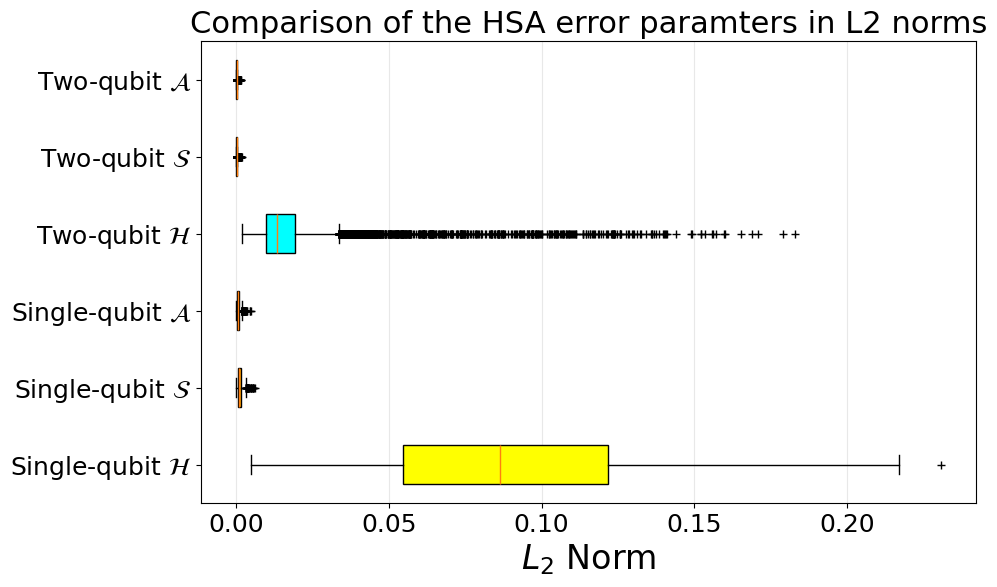

In [3]:
data = [H_single_list, S_single_list, A_single_list, H_double_list, S_double_list, A_double_list]
labels = [r'Single-qubit $\mathcal{H}$', r'Single-qubit $\mathcal{S}$', r'Single-qubit $\mathcal{A}$',
          r'Two-qubit $\mathcal{H}$', r'Two-qubit $\mathcal{S}$', r'Two-qubit $\mathcal{A}$']
#magma = plt.get_cmap('magma') 
#cNorm  = colors.Normalize(vmin=0, vmax=5)
#scalarMap = cm.ScalarMappable(norm=cNorm, cmap=magma)
colors = ['yellow', 'orange', 'red', 'aqua', 'deepskyblue', 'blue']
fig, ax = plt.subplots(figsize=(10, 6))
#fig.subplots_adjust(left=0.075, right=0.95, top=0.9, bottom=0.25)

boxes = ax.boxplot(data, vert=False, whis=1.5, patch_artist=True)
plt.setp(boxes['boxes'], color='black')
plt.setp(boxes['whiskers'], color='black')
plt.setp(boxes['fliers'], color='red', marker='+')

for patch, color in zip(boxes['boxes'], colors):
    patch.set_facecolor(color)

ax.set_yticklabels(labels,rotation=0, fontsize=18)

ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)

ax.set_title('Comparison of the HSA error paramters in L2 norms', fontsize=22)
ax.set_xlabel(r"$L_2$ Norm",fontsize=24)
ax.tick_params(axis='x', which='major', labelsize=18)

#fig.savefig('C:/Users/k0426/Documents/PhD_Project/paper 1/HSA error parameters comparison.pdf', dpi=300, bbox_inches="tight")

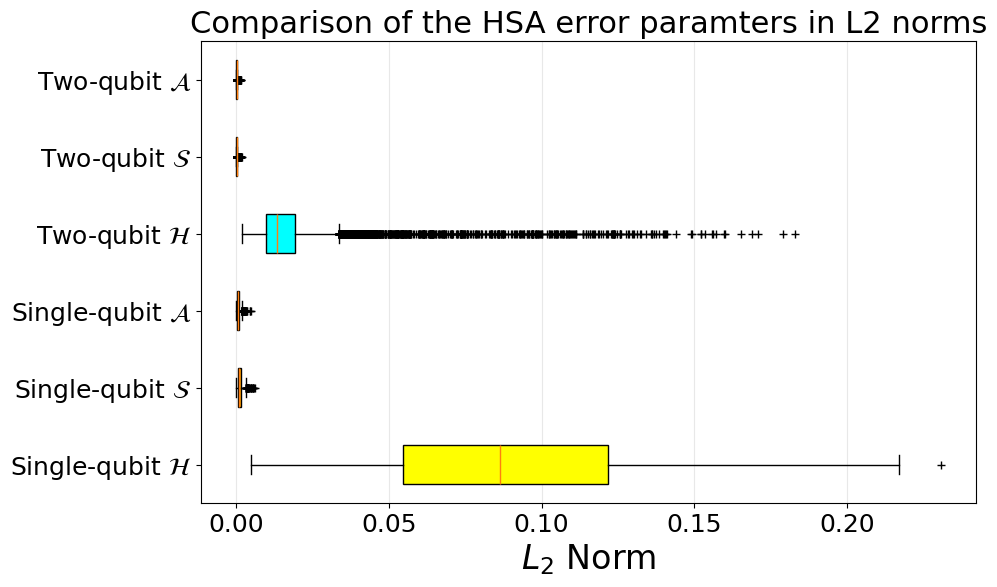

In [9]:
data = [H_single_list, S_single_list, A_single_list, H_double_list, S_double_list, A_double_list]
labels = [r'Single-qubit $\mathcal{H}$', r'Single-qubit $\mathcal{S}$', r'Single-qubit $\mathcal{A}$',
          r'Two-qubit $\mathcal{H}$', r'Two-qubit $\mathcal{S}$', r'Two-qubit $\mathcal{A}$']
#magma = plt.get_cmap('magma') 
#cNorm  = colors.Normalize(vmin=0, vmax=5)
#scalarMap = cm.ScalarMappable(norm=cNorm, cmap=magma)
colors = ['yellow', 'orange', 'red', 'aqua', 'deepskyblue', 'blue']
fig, ax = plt.subplots(figsize=(10, 6))
#fig.subplots_adjust(left=0.075, right=0.95, top=0.9, bottom=0.25)

boxes = ax.boxplot(data, vert=False, whis=1.5, patch_artist=True)
plt.setp(boxes['boxes'], color='black')
plt.setp(boxes['whiskers'], color='black')
plt.setp(boxes['fliers'], color='red', marker='+')

for patch, color in zip(boxes['boxes'], colors):
    patch.set_facecolor(color)

ax.set_yticklabels(labels,rotation=0, fontsize=18)

ax.xaxis.grid(True, linestyle='-', which='major', color='lightgrey', alpha=0.5)

ax.set_title('Comparison of the HSA error paramters in L2 norms', fontsize=22)
ax.set_xlabel(r"$L_2$ Norm",fontsize=24)
ax.tick_params(axis='x', which='major', labelsize=18)

fig.savefig('C:/Users/k0426/Documents/PhD_Project/paper 1/HSA error parameters comparison.pdf', dpi=300, bbox_inches="tight")


In [2]:
path = "./noise_dict.pkl"
with open(path, "rb") as f:
    error_dict = pickle.load(f)

graph = nx.from_edgelist(edges27)

H_single_distances = {i: [] for i in range(1, 12)}
#H_double_distances = {i: [] for i in range(1, 12)}
S_single_distances = {i: [] for i in range(1, 12)}
#S_double_distances = {i: [] for i in range(1, 12)}
A_single_distances = {i: [] for i in range(1, 12)}
#A_double_distances = {i: [] for i in range(1, 12)}
H_double_distances = {}
S_double_distances = {}
A_double_distances = {}

error_dict_new = {gate: {q:{} for q in range(27) if q not in gate}|{(q1, q2):{} for q1 in range(27) for q2 in range(27) if q2>q1 and (q1 not in gate) and (q2 not in gate)} 
                  for gate in error_dict.keys()}

for gate, error_params in error_dict.items():
    for error_name, error_rate in error_params.items():
        error_type = error_name.split(':')[0]
        error_targets = error_name.split(':')[1]
        
        if len(error_type) == 2:
            error_dict_new[gate][int(error_targets)][error_type] = error_rate
        
        else:
            error_targets = (int(error_targets.split(',')[0]), int(error_targets.split(',')[1]))
            error_dict_new[gate][error_targets][error_type] = error_rate
            
#error_dict_new = {('Gcnot',0,1): error_dict_new[('Gcnot',0,1)]}
print(error_dict_new)
print(error_dict_new[('Gcnot',0,1)])

for gate, targets_dict in error_dict_new.items():
    for targets, error_params_dict in targets_dict.items():
        if type(targets) is int:
            H_single = []
            S_single = []
            A_single = []
            distance = min(nx.shortest_path_length(graph, gate[1], targets), nx.shortest_path_length(graph, gate[2], targets))
            for error_param, error_rate in error_params_dict.items():
                if error_param[0] == 'H':
                    H_single.append(error_rate)
                elif error_param[0] == 'S':
                    S_single.append(error_rate)
                else:
                    A_single.append(error_rate)
            H_single_distances[distance].append(norm(H_single))
            S_single_distances[distance].append(norm(S_single))
            A_single_distances[distance].append(norm(A_single))
            
        else:
            H_double = []
            S_double = []
            A_double = []
            #distance = min(nx.shortest_path_length(graph, gate[1], targets[0]), nx.shortest_path_length(graph, gate[2], targets[0]),
            #               nx.shortest_path_length(graph, gate[1], targets[1]), nx.shortest_path_length(graph, gate[2], targets[1]))
            
            distance = min(nx.shortest_path_length(graph, gate[1], targets[0]), nx.shortest_path_length(graph, gate[2], targets[0]),
                           nx.shortest_path_length(graph, gate[1], targets[1]), nx.shortest_path_length(graph, gate[2], targets[1]))*nx.shortest_path_length(graph, targets[0], targets[1])
            #distance = nx.shortest_path_length(graph, targets[0], targets[1])
            for error_param, error_rate in error_params_dict.items():
                if error_param[0] == 'H':
                    H_double.append(error_rate)
                elif error_param[0] == 'S':
                    S_double.append(error_rate)
                else:
                    A_double.append(error_rate)
            if distance in H_double_distances.keys():
                H_double_distances[distance].append(norm(H_double))
            else:
                H_double_distances[distance] = [norm(H_double)]
            if distance in S_double_distances.keys():
                S_double_distances[distance].append(norm(S_double))
            else:
                S_double_distances[distance] = [norm(S_double)]
            if distance in A_double_distances.keys():
                A_double_distances[distance].append(norm(A_double))
            else:
                A_double_distances[distance] = [norm(A_double)]

{('Gcnot', 0, 1): {2: {'SX': 0.0001787743463250473, 'SY': 0.00030585029483042546, 'SZ': 0.0011602533866387637, 'AX': 1.5151780692355491e-05, 'AY': 1.2970430298548765e-05, 'AZ': 0.00015285091331275854, 'HX': -0.17658529341081677, 'HY': -0.02666478210980974, 'HZ': 0.03261043525356062}, 3: {'SX': 0.0003953671790169433, 'SY': 0.00044439743036477715, 'SZ': 0.000956332181649537, 'AX': 0.0001877851476433672, 'AY': -0.00014621895088001718, 'AZ': 0.0002097841836473087, 'HX': -0.14848690493852942, 'HY': 0.007353576825229921, 'HZ': 0.042500908569685504}, 4: {'SX': 0.0006918923648211764, 'SY': 0.0008553068795108633, 'SZ': 0.0012704051269716854, 'AX': 0.000231990230678367, 'AY': -0.0002399311421982476, 'AZ': 0.00011760743965796832, 'HX': -0.12224103526074183, 'HY': -0.04602097461329383, 'HZ': -0.0005362900486602687}, 5: {'SX': 0.000905483837029383, 'SY': 0.0009900641154460663, 'SZ': 0.0017962005148779389, 'AX': 0.00012081993980024752, 'AY': -0.00025262224035682665, 'AZ': 0.0004204210068712358, 'HX'

In [ ]:
H_single_mean = []
H_double_mean = []
S_single_mean = []
S_double_mean = []
A_single_mean = []
A_double_mean = []
H_single_std = []
H_double_std = []
S_single_std = []
S_double_std = []
A_single_std = []
A_double_std = []
#PRINT()
distances = list(range(1,12))

for distance, norm_list in H_single_distances.items():
    H_single_mean.append(np.mean(norm_list))
    H_single_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in H_double_distances.items():
    H_double_mean.append(np.mean(norm_list))
    H_double_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in S_single_distances.items():
    S_single_mean.append(np.mean(norm_list))
    S_single_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in S_double_distances.items():
    S_double_mean.append(np.mean(norm_list))
    S_double_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in A_single_distances.items():
    A_single_mean.append(np.mean(norm_list))
    A_single_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in A_double_distances.items():
    A_double_mean.append(np.mean(norm_list))
    A_double_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))

print(H_double_std)
#plt.style.use('classic')
fig, ax = plt.subplots(figsize = (15,10))

ax.errorbar(distances, H_single_mean, yerr=2*np.array(H_single_std), label='single-qubit H', marker = 'o', linewidth=1, markersize=7)
ax.errorbar(distances, S_single_mean, yerr=2*np.array(S_single_std), label='single-qubit S', marker = 's', linewidth=1, markersize=7)
ax.errorbar(distances, A_single_mean, yerr=2*np.array(A_single_std), label='single-qubit A', marker = '^', linewidth=1, markersize=7)

ax.errorbar(distances, H_double_mean, yerr=2*np.array(H_double_std), label='two-qubit H', marker = 'o', linewidth=1, markersize=7)
ax.errorbar(distances, S_double_mean, yerr=2*np.array(S_double_std), label='two-qubit S', marker = 's', linewidth=1, markersize=7)
ax.errorbar(distances, A_double_mean, yerr=2*np.array(A_double_std), label='two-qubit A', marker = '^', linewidth=1, markersize=7)

ax.legend(fontsize=16)
ax.grid()
#ax.set_xticks(list(range(1,grover_iterations+1)))
#ax.set_xlim(0, 12)
#ax.set_ylim(0, 0.002)
ax.tick_params(axis='both', which='major', labelsize=18)
ax.set_yscale('log')
ax.set_title(r'Crosstalk Error parameters $L^2$ Norm', fontsize=20)
ax.set_xlabel("Distance",fontsize=20)
ax.set_ylabel("Norm",fontsize=20)

#fig.savefig('C:/Users/k0426/Documents/PhD_Project/paper 1/HSA error parameters radii.pdf', dpi=300, bbox_inches="tight")

[0.0014093042060015727, 0.0006482572835812189, 0.0005149370221928325, 0.0006178588478692746, 0.0005230823124713102, 0.00038563004162677514, 0.0004092286997028863, 0.0008362126770715727, 0.0006363512683393254, 0.0003414968890750272, 0.00035949934727096437, 0.0003223961026142626, 0.0005282221799834143, 0.0005494499191670477, 0.00043727557925413467, 0.0004509603615372318, 0.0004999911587756534, 0.00048626942778039054, 0.0012226983627774976, 0.0006162779001635435, 0.0003878332427332159, 0.0008093751350698716, 0.0006234572572932904, 0.000935964522487536, 0.0006779580387182217, 0.0018427634356148342, 0.0008691888068091497, 0.0010263956062314475, 0.0016530253742560316, 0.004491290626591129, 0.0017558082486424556, 0.001553044807318347, 0.001051485944196646, 0.0010659532777736122, 0.00047046693197107156, 0.001157349624359171, 0.0006683265213344792, 0.00047002037218428575, 0.0006826782575247171, 0.0009954975082995766]


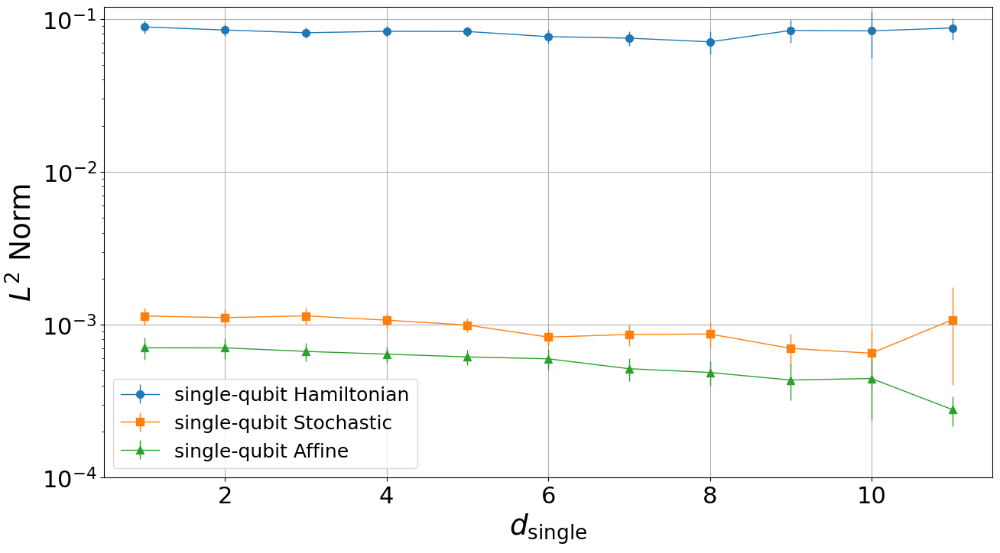

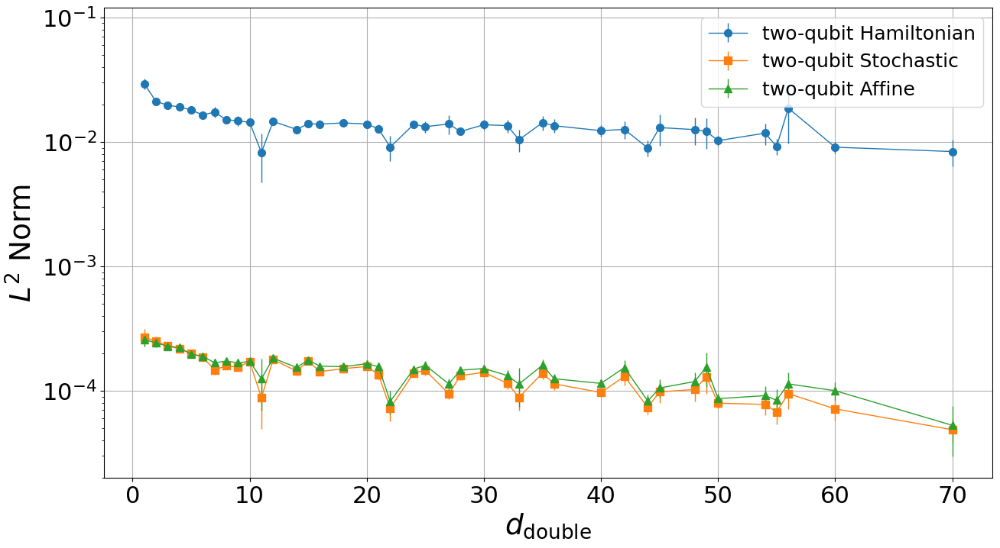

In [5]:
H_single_mean = []
H_double_mean = []
S_single_mean = []
S_double_mean = []
A_single_mean = []
A_double_mean = []
H_single_std = []
H_double_std = []
S_single_std = []
S_double_std = []
A_single_std = []
A_double_std = []
#PRINT()
distances = list(range(1,12))
distances_H_double = list(H_double_distances.keys())
distances_S_double = list(S_double_distances.keys())
distances_A_double = list(A_double_distances.keys())
for distance, norm_list in H_single_distances.items():
    H_single_mean.append(np.mean(norm_list))
    H_single_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in H_double_distances.items():
    H_double_mean.append(np.mean(norm_list))
    H_double_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in S_single_distances.items():
    S_single_mean.append(np.mean(norm_list))
    S_single_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in S_double_distances.items():
    S_double_mean.append(np.mean(norm_list))
    S_double_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in A_single_distances.items():
    A_single_mean.append(np.mean(norm_list))
    A_single_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))
for distance, norm_list in A_double_distances.items():
    A_double_mean.append(np.mean(norm_list))
    A_double_std.append(np.std(norm_list)/np.sqrt(len(norm_list)))

print(H_double_std)


H_double_sorted = [(distance, mean, 2*std) for distance, mean, std in sorted(zip(distances_H_double, H_double_mean, H_double_std), key=lambda pair: pair[0])]
S_double_sorted = [(distance, mean, 2*std) for distance, mean, std in sorted(zip(distances_S_double, S_double_mean, S_double_std), key=lambda pair: pair[0])]
A_double_sorted = [(distance, mean, 2*std) for distance, mean, std in sorted(zip(distances_A_double, A_double_mean, A_double_std), key=lambda pair: pair[0])]


#plt.style.use('classic')
fig, ax = plt.subplots(figsize = (15,8))
fig2, ax2 = plt.subplots(figsize = (15,8))
ax.errorbar(distances, H_single_mean, yerr=2*np.array(H_single_std), label='single-qubit Hamiltonian', marker = 'o', linewidth=1, markersize=7)
ax.errorbar(distances, S_single_mean, yerr=2*np.array(S_single_std), label='single-qubit Stochastic', marker = 's', linewidth=1, markersize=7)
ax.errorbar(distances, A_single_mean, yerr=2*np.array(A_single_std), label='single-qubit Affine', marker = '^', linewidth=1, markersize=7)

#ax2.errorbar(distances_H_double, H_double_mean, yerr=2*np.array(H_double_std), label='two-qubit Hamiltonian', marker = 'o', linewidth=1, fmt='o', markersize=7)
#ax2.errorbar(distances_S_double, S_double_mean, yerr=2*np.array(S_double_std), label='two-qubit Stochastic', marker = 's', linewidth=1, fmt='o', markersize=7)
#ax2.errorbar(distances_A_double, A_double_mean, yerr=2*np.array(A_double_std), label='two-qubit Affine', marker = '^', linewidth=1, fmt='o', markersize=7)

ax2.errorbar(*zip(*H_double_sorted), label='two-qubit Hamiltonian', marker = 'o', linewidth=1, markersize=7)
ax2.errorbar(*zip(*S_double_sorted), label='two-qubit Stochastic', marker = 's', linewidth=1, markersize=7)
ax2.errorbar(*zip(*A_double_sorted), label='two-qubit Affine', marker = '^', linewidth=1, markersize=7)

ax.legend(fontsize=18)
ax.grid()
#ax.set_xticks(list(range(1,grover_iterations+1)))
#ax.set_xlim(0, 12)
ax.set_ylim(0.0001, 0.12)
ax.tick_params(axis='both', which='major', labelsize=22)
ax.set_yscale('log')
#ax.set_title('Single-qubit error parameters', fontsize=20)
ax.set_xlabel(r"$d_{\text{single}}$",fontsize=27)
ax.set_ylabel(r"$L^2$ Norm",fontsize=27)

ax2.legend(fontsize=18)
ax2.grid()
#ax.set_xticks(list(range(1,grover_iterations+1)))
#ax.set_xlim(0, 12)
ax2.set_ylim(2e-5, 0.12)
ax2.tick_params(axis='both', which='major', labelsize=22)
ax2.set_yscale('log')
#ax2.set_title('Two-qubit error parameters', fontsize=20)
ax2.set_xlabel(r"$d_{\text{double}}$",fontsize=27)
ax2.set_ylabel(r"$L^2$ Norm",fontsize=27)
fig.savefig('C:/Users/k0426/Documents/PhD_Project/paper 1/HSA error parameters radii single.pdf', dpi=300, bbox_inches="tight")
fig2.savefig('C:/Users/k0426/Documents/PhD_Project/paper 1/HSA error parameters radii double.pdf', dpi=300, bbox_inches="tight")